In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import nltk
nltk.download('stopwords')

nltk.download('punkt')


from sklearn.pipeline import make_pipeline
import time


from sklearn.preprocessing import StandardScaler




[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\amrut\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\amrut\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
pip install emoji

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install wordsegment

In [4]:
pip install contractions

Note: you may need to restart the kernel to use updated packages.


In [5]:
# Data loading using chunk size

reviews = pd.read_json('yelp_academic_dataset_review.json', lines=True, chunksize=20000)

# Iterate through chunks and process each one
chunk_list = []
for chunk in reviews:
    chunk_list.append(chunk)
    
# Concatenate the chunks after reading
reviews_df = pd.concat(chunk_list, ignore_index=True)


In [11]:
reviews_df.head()

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15


In [13]:
reviews_df.shape

(6990280, 9)

In [15]:
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6990280 entries, 0 to 6990279
Data columns (total 9 columns):
 #   Column       Dtype         
---  ------       -----         
 0   review_id    object        
 1   user_id      object        
 2   business_id  object        
 3   stars        int64         
 4   useful       int64         
 5   funny        int64         
 6   cool         int64         
 7   text         object        
 8   date         datetime64[ns]
dtypes: datetime64[ns](1), int64(4), object(4)
memory usage: 480.0+ MB


In [17]:
reviews_df.isnull().sum()

review_id      0
user_id        0
business_id    0
stars          0
useful         0
funny          0
cool           0
text           0
date           0
dtype: int64

# Target Variable creation

In [18]:

# Creating the target variable (Positive, Negative, Neutral)
def label_review(stars):
    if stars >= 4:
        return '1'   # positive
    elif stars <= 2:
        return '-1'  # negative
    else:
        return '0'   # Neutral


reviews_df['sentiment'] = reviews_df['stars'].apply(label_review)

reviews_df.head()



,review_id,user_id,business_id,stars,useful,funny,cool,text,date,sentiment
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,0
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18,1
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30,0
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03,1
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15,1


# Preprocessing the 'text' columns
1. lowercasing
2. removing punctuation
3. Removing stop words
4. Negation handling  - Not, No, Never, None, n't
5. Expanding Contractions
6. Handling abbrevations
7. removing emojis and hashtags
8. Tokenization
9. Stemming - reducing the word to base form
gs

In [21]:
# Sampling 3% of the data
sampled_reviews = reviews_df.sample(frac=0.03, random_state=42)  


print(f"Sampled data size: {sampled_reviews.shape}")


Sampled data size: (209708, 10)


In [23]:
import re
import emoji
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordsegment import load, segment
import contractions  
#import abbr  


load()


stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def expand_contractions(text):
    
    return contractions.fix(text)



def clean_hashtags(text):
    
    hashtags = re.findall(r'#\w+', text)
    for hashtag in hashtags:
        words = ' '.join(segment(hashtag[1:]))  
        text = text.replace(hashtag, words)
    return text

def handle_negation(text):
    
    negation_patterns = re.compile(r'\b(?:not|no|never|none|n\'t)\b[\w\s]+[^\w\s]')
    return negation_patterns.sub(lambda match: '_'.join(match.group(0).split()), text)

def clean_text(text):
   
    # lowercase
    text = text.lower()

    # Expanding contractions
    text = expand_contractions(text)
    

    # negation
    text = handle_negation(text)

    # hashtags
    text = clean_hashtags(text)

    # emojis
    text = emoji.demojize(text)

    # punctuation and special characters
    text = re.sub(r'[^\w\s]', '', text)

    
    tokens = word_tokenize(text)
    tokens = [stemmer.stem(word) for word in tokens if word not in stop_words]

    return ' '.join(tokens)






sampled_reviews['final_cleaned_text'] = sampled_reviews['text'].apply(clean_text)



sampled_reviews.head()

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,sentiment,final_cleaned_text
1295256,J5Q1gH4ACCj6CtQG7Yom7g,56gL9KEJNHiSDUoyjk2o3Q,8yR12PNSMo6FBYx1u5KPlw,2,1,0,0,Went for lunch and found that my burger was me...,2018-04-04 21:09:53,-1,went lunch found burger meh obviou focu burger...
3297618,HlXP79ecTquSVXmjM10QxQ,bAt9OUFX9ZRgGLCXG22UmA,pBNucviUkNsiqhJv5IFpjg,5,0,0,0,I needed a new tires for my wife's car. They h...,2020-05-24 12:22:14,1,need new tire wife car special order next day ...
1217795,JBBULrjyGx6vHto2osk_CQ,NRHPcLq2vGWqgqwVugSgnQ,8sf9kv6O4GgEb0j1o22N1g,5,0,0,0,Jim Woltman who works at Goleta Honda is 5 sta...,2019-02-14 03:47:48,1,jim woltman work goleta honda 5 star knowledg ...
3730348,U9-43s8YUl6GWBFCpxUGEw,PAxc0qpqt5c2kA0rjDFFAg,XwepyB7KjJ-XGJf0vKc6Vg,4,0,0,0,Been here a few times to get some shrimp. The...,2013-04-27 01:55:49,1,time get shrimp got nice select differ fish pr...
1826590,8T8EGa_4Cj12M6w8vRgUsQ,BqPR1Dp5Rb_QYs9_fz9RiA,prm5wvpp0OHJBlrvTj9uOg,5,0,0,0,This is one fantastic place to eat whether you...,2019-05-15 18:29:25,1,one fantast place eat whether hungri need good...


In [25]:
sampled_reviews.reset_index(drop=True, inplace=True)

In [27]:
sampled_reviews.head(10)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,sentiment,final_cleaned_text
0,J5Q1gH4ACCj6CtQG7Yom7g,56gL9KEJNHiSDUoyjk2o3Q,8yR12PNSMo6FBYx1u5KPlw,2,1,0,0,Went for lunch and found that my burger was me...,2018-04-04 21:09:53,-1,went lunch found burger meh obviou focu burger...
1,HlXP79ecTquSVXmjM10QxQ,bAt9OUFX9ZRgGLCXG22UmA,pBNucviUkNsiqhJv5IFpjg,5,0,0,0,I needed a new tires for my wife's car. They h...,2020-05-24 12:22:14,1,need new tire wife car special order next day ...
2,JBBULrjyGx6vHto2osk_CQ,NRHPcLq2vGWqgqwVugSgnQ,8sf9kv6O4GgEb0j1o22N1g,5,0,0,0,Jim Woltman who works at Goleta Honda is 5 sta...,2019-02-14 03:47:48,1,jim woltman work goleta honda 5 star knowledg ...
3,U9-43s8YUl6GWBFCpxUGEw,PAxc0qpqt5c2kA0rjDFFAg,XwepyB7KjJ-XGJf0vKc6Vg,4,0,0,0,Been here a few times to get some shrimp. The...,2013-04-27 01:55:49,1,time get shrimp got nice select differ fish pr...
4,8T8EGa_4Cj12M6w8vRgUsQ,BqPR1Dp5Rb_QYs9_fz9RiA,prm5wvpp0OHJBlrvTj9uOg,5,0,0,0,This is one fantastic place to eat whether you...,2019-05-15 18:29:25,1,one fantast place eat whether hungri need good...
5,18E_haOfOm8ks-A7SlVWRg,bnDZpsii_if2_wpn8oPcig,bK0j7YtVyN98UnM_8fUONg,3,1,1,1,Dirt cheap happy hour specials. Half priced d...,2011-11-08 01:30:27,0,dirt cheap happi hour special half price drink...
6,8rD5LvgHVPSnyyae4ji4dA,YxpJDf6Idn7MA9E003B0Zw,zLIrhVc1nfPTOF33eFD4_g,1,4,1,0,"Unbelievably poor customer ""service"". Beyond ...",2011-05-15 22:58:44,-1,unbeliev poor custom servic beyond bad insist ...
7,hYYN8bWKRW29qqdpaKOdMg,8H183Gq4be1PqKBW7jbIiA,KHl171eshtTPrGyBWGEHQQ,5,1,0,0,I walked in the door and was greeted with a we...,2015-05-24 11:48:33,1,walk door greet welcom smile offer help find g...
8,xQVDB9xRdpLmPh9XMQ6Gvg,yy38DH7ENFTJ10-d4GUlig,S26FJcC298XNpN2cZiwOrA,5,0,0,0,Nothing beats pizza and beer in my book. This ...,2012-12-24 02:18:18,1,noth beat pizza beer book place nail eye towar...
9,c7IQ5alG0pl9yCITtsIlrA,ZLKpeCqbCMWfNeT6yU8wUQ,zT2OzXDWKK1abapHs2RUrQ,5,1,0,0,Philly cheese steak (loaded) was phenomenal. ...,2021-07-02 02:17:40,1,philli chees steak load phenomen good servic v...


In [29]:
sampled_reviews.shape

(209708, 11)

# Train-test split

In [31]:

x_train, x_test, y_train, y_test = train_test_split(sampled_reviews['final_cleaned_text'], sampled_reviews['sentiment'], test_size=0.2, stratify=sampled_reviews['sentiment'], random_state=42)


print(y_train.value_counts())

sentiment
1     112467
-1     38654
0      16645
Name: count, dtype: int64


In [33]:
x_train.head

<bound method NDFrame.head of 181428    best pizza st pete opinion kind upset took lon...
32644     first thing need know pinewood social extrem i...
55173     food pretti good got meal grill beyond eat not...
204776    flowmast 44 put charger right bought figur bou...
73757     got number 11 omg sam made tast differ 30 year...
                                ...                        
112375    hi tri today buisi clean good servic food not_...
84605     spent 5 year philli share cheesesteak enjoy pa...
178864    use eat time howev last visit walk front entra...
164703    chick fil food good consist lunch encount toda...
161646    staff friendli way around think clearwat much ...
Name: final_cleaned_text, Length: 167766, dtype: object>

In [37]:
y_train.head()

181428     1
32644      1
55173     -1
204776     1
73757      1
Name: sentiment, dtype: object

# saving files

In [39]:
x_train.to_csv( 'x_train_ml2.csv',index=False)
y_train.to_csv( 'y_train_ml2.csv',index=False)
x_test.to_csv('x_test_ml2.csv',index=False)
y_test.to_csv('y_test_ml2.csv',index=False)

# Vectorization -  Unigram Count Vectorizer

In [ ]:
x_train = pd.read_csv('x_train_ml2.csv')

In [ ]:
x_test = pd.read_csv('x_test_ml2.csv')

In [ ]:
y_train = pd.read_csv('y_train_ml2.csv')

In [ ]:
y_test = pd.read_csv('y_test_ml2.csv')

In [41]:

count_vectorizer_unigram = CountVectorizer(ngram_range=(1, 1), max_features=5000, max_df=0.9,min_df=5)


x_train_count_unigram = count_vectorizer_unigram.fit_transform(x_train)
x_test_count_unigram = count_vectorizer_unigram.transform(x_test)


In [43]:
x_train_count_unigram.shape

(167766, 5000)

In [45]:

feature_names = count_vectorizer_unigram.get_feature_names_out()

x_train_count_unigram_df = pd.DataFrame(x_train_count_unigram.toarray(), columns=feature_names)


x_train_count_unigram_df.head()


,10,100,1000,1010,1015,1030,10am,10pm,10th,11,...,yr,yuck,yum,yummi,yup,zero,zip,zone,zoo,zucchini
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


# SVM with Unigram Count vectorization with 30k records-  Model tuning 1

In [47]:
x_train.head()

181428    best pizza st pete opinion kind upset took lon...
32644     first thing need know pinewood social extrem i...
55173     food pretti good got meal grill beyond eat not...
204776    flowmast 44 put charger right bought figur bou...
73757     got number 11 omg sam made tast differ 30 year...
Name: final_cleaned_text, dtype: object

In [49]:
y_train.head()

181428     1
32644      1
55173     -1
204776     1
73757      1
Name: sentiment, dtype: object

In [51]:

# Sampling data function 


def sample_data(x_train, y_train, sample_size):
   

    indices = np.random.choice(x_train.shape[0], sample_size, replace=False)
    
   
    x_train_sample = x_train[indices]
    y_train_sample = y_train.iloc[indices] if hasattr(y_train, 'iloc') else y_train[indices]
    
    
    print(f"x_train_sample shape: {x_train_sample.shape}")
    print(f"y_train_sample shape: {y_train_sample.shape}")
    
    return x_train_sample, y_train_sample


In [53]:
x_train_sample, y_train_sample = sample_data(x_train_count_unigram, y_train, sample_size=30000)


x_train_sample shape: (30000, 5000)
y_train_sample shape: (30000,)


In [57]:
#SVM Model building
svm_model = make_pipeline(StandardScaler(with_mean=False), SVC(kernel='rbf', probability=True)) 


start_time = time.time()
svm_model.fit(x_train_sample, y_train_sample)
train_time = time.time() - start_time

print(f"Model trained with Unigram + Count Vectors configuration.")
print(f"Train Time: {train_time:.2f} seconds for 30k records")


Model trained with Unigram + Count Vectors configuration.
Train Time: 3766.48 seconds for 30k records


In [60]:
# Evaluation Metrics Function
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

def evaluate_svm_model_on_train_test(model, x_train, y_train, x_test, y_test):
    
    
    def calculate_metrics(x, y, dataset_name):
        y_pred = model.predict(x)
        accuracy = accuracy_score(y, y_pred)
        precision = precision_score(y, y_pred, average='weighted')
        recall = recall_score(y, y_pred, average='weighted')
        f1 = f1_score(y, y_pred, average='weighted')
        conf_matrix = confusion_matrix(y, y_pred)
        
   
        print(f"\nClassification Report ({dataset_name}):\n", classification_report(y, y_pred))
        print(f"Confusion Matrix ({dataset_name}):\n", conf_matrix)
        
        metrics = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'confusion_matrix': conf_matrix
        }
        return metrics
    
    
    print("\nEvaluating on Training Data:")
    metrics_train = calculate_metrics(x_train_sample, y_train_sample, 'Train')
    
    
    print("\nEvaluating on Testing Data:")
    metrics_test = calculate_metrics(x_test_count_unigram, y_test, 'Test')
    
    return metrics_train, metrics_test


train_metrics, test_metrics = evaluate_svm_model_on_train_test(svm_model, x_train_sample, y_train_sample, x_test_count_unigram, y_test)


print("\nTraining Metrics:")
print(f"Accuracy: {train_metrics['accuracy']:.2f}")
print(f"Precision: {train_metrics['precision']:.2f}")
print(f"Recall: {train_metrics['recall']:.2f}")
print(f"F1 Score: {train_metrics['f1_score']:.2f}")

print("\nTesting Metrics:")
print(f"Accuracy: {test_metrics['accuracy']:.2f}")
print(f"Precision: {test_metrics['precision']:.2f}")
print(f"Recall: {test_metrics['recall']:.2f}")
print(f"F1 Score: {test_metrics['f1_score']:.2f}")



Evaluating on Training Data:

Classification Report (Train):
               precision    recall  f1-score   support

          -1       0.94      0.93      0.93      6927
           0       0.98      0.51      0.67      2941
           1       0.93      1.00      0.96     20132

    accuracy                           0.93     30000
   macro avg       0.95      0.81      0.86     30000
weighted avg       0.94      0.93      0.93     30000

Confusion Matrix (Train):
 [[ 6421    21   485]
 [  337  1503  1101]
 [   57     7 20068]]

Evaluating on Testing Data:

Classification Report (Test):
               precision    recall  f1-score   support

          -1       0.84      0.70      0.76      9664
           0       0.60      0.06      0.11      4161
           1       0.83      0.99      0.90     28117

    accuracy                           0.83     41942
   macro avg       0.76      0.58      0.59     41942
weighted avg       0.81      0.83      0.79     41942

Confusion Matrix (Test)

1. The model performs very well on class 1 across both train and test sets, showing high precision and recall.
2. Class 0 has significantly lower performance, especially in the test set, with low recall (only 8% correct predictions) and low F1 score, indicating that the model struggles to correctly identify this class.
3. Class -1 has good performance overall, but recall drops in the test set compared to the training set, indicating some overfitting for this class.
The overall accuracy is good (94% on training and 83% on testing), but there is a noticeable drop in test accuracy, which suggests the model may be slightly overfitting.
Improving the performance for class 0 might require further tuning and adjusting class weights.

# SVM Model with 40k records - Model tuning 2

In [108]:
x_train_sample, y_train_sample = sample_data(x_train_count_unigram, y_train, sample_size=40000)


x_train_sample shape: (40000, 5000)
y_train_sample shape: (40000,)


In [120]:
#SVM Model building -2
svm_model = make_pipeline(StandardScaler(with_mean=False), SVC(kernel='rbf')) 


start_time = time.time()
svm_model.fit(x_train_sample, y_train_sample)
train_time = time.time() - start_time

print(f"Model trained with Unigram + Count Vectors configuration.")
print(f"Train Time: {train_time:.2f} seconds for 40k records")


Model trained with Unigram + Count Vectors configuration.
Train Time: 1291.55 seconds for 40k records


# Feature Importance analysis

In [124]:
pip install lime

     ---------------------------------------- 0.0/275.7 kB ? eta -:--:--
     - -------------------------------------- 10.2/275.7 kB ? eta -:--:--
     ----- ------------------------------ 41.0/275.7 kB 487.6 kB/s eta 0:00:01
     ------------------------------------- 275.7/275.7 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283842 sha256=2a114819196263cbc464ac0af529c225125b5a9f586ae7bbc0adf1bac94fca96
  Stored in directory: c:\users\sspc1\appdata\local\pip\cache\wheels\85\fa\a3\9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime
Note: you may need to restart the kernel to use updated packages.


## Lime for SVM

In [79]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd

# Assuming 'x_train_sample' is the sampled training data and 'svm_rbf' is the trained SVM model
# Also assuming 'x_test_count_unigram' is your test set in sparse format and 'feature_names' contains your feature labels

# Step 1: Create a LIME explainer for tabular data
explainer = lime.lime_tabular.LimeTabularExplainer(
    x_train_sample.toarray(),            # Convert training data to dense format
    feature_names=feature_names,          # Names of features
    class_names=['Negative', 'Neutral', 'Positive'],  # Labels for the sentiment classes
    discretize_continuous=True             # Discretize continuous features for explanation
)

# Step 2: Sample 10 instances from the test data
sample_size = 10
indices = np.random.choice(x_test_count_unigram.shape[0], sample_size, replace=False)
x_test_sample = x_test_count_unigram[indices].toarray()  # Convert to dense format

# Step 3: Create a function to explain multiple predictions
def explain_multiple_instances(model, data, explainer, num_features=5):
    explanations = []
    
    for i in range(data.shape[0]):
        sample = data[i].reshape(1, -1)  # Reshape for single prediction
        exp = explainer.explain_instance(sample.flatten(), model.predict_proba, num_features=num_features)
        explanations.append(exp)
        
        # Optionally, visualize each explanation
        exp.show_in_notebook(show_table=True)
    
    return explanations

# Step 4: Get explanations for the sampled instances
explanations = explain_multiple_instances(svm_model, x_test_sample, explainer)

# Step 5: Analyze and summarize feature importance
# For analysis, you might want to aggregate feature importance across the explanations
feature_importances = {}

for exp in explanations:
    for feature, importance in exp.as_list():
        if feature not in feature_importances:
            feature_importances[feature] = 0
        feature_importances[feature] += importance

# Print the aggregated feature importances
sorted_importances = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)
print("Aggregated Feature Importances:")
for feature, importance in sorted_importances:
    print(f"{feature}: {importance:.4f}")


Aggregated Feature Importances:
noth > 0.00: 0.1210
decent <= 0.00: -0.1461
not_great <= 0.00: -0.1500
underwhelm <= 0.00: -0.1843
noth <= 0.00: -0.2184
stale <= 0.00: -0.2247
averag <= 0.00: -0.3411
lack <= 0.00: -0.3658
mediocr <= 0.00: -0.4316
not_bad <= 0.00: -1.1303
ok <= 0.00: -1.4676
okay <= 0.00: -1.7473
aok <= 0.00: -2.3469


# One-Hot Unigram Vectorizer 

In [ ]:

one_hot_vectorizer_unigram = CountVectorizer(ngram_range=(1, 1), binary=True,max_features=5000)


x_train_onehot_unigram = one_hot_vectorizer_unigram.fit_transform(x_train)
x_test_onehot_unigram = one_hot_vectorizer_unigram.transform(x_test)


# Class separability check on Unigram Count vectorizer 


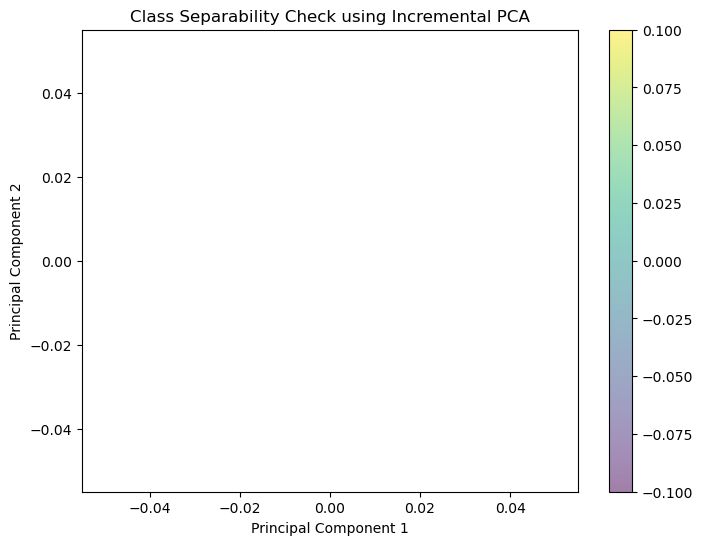

In [92]:
from sklearn.decomposition import IncrementalPCA
import matplotlib.pyplot as plt
import numpy as np





ipca = IncrementalPCA(n_components=2)

batch_size = 1000


for i in range(0, x_train_count_unigram.shape[0], batch_size):
    ipca.partial_fit(x_train_count_unigram[i:i + batch_size].toarray())


x_train_pca = np.empty((x_train_count_unigram.shape[0], 2))

for i in range(0, x_train_count_unigram.shape[0], batch_size):
    x_train_pca[i:i + batch_size] = ipca.transform(x_train_count_unigram[i:i + batch_size].toarray())



Mapped unique values after conversion: [2 0 1]


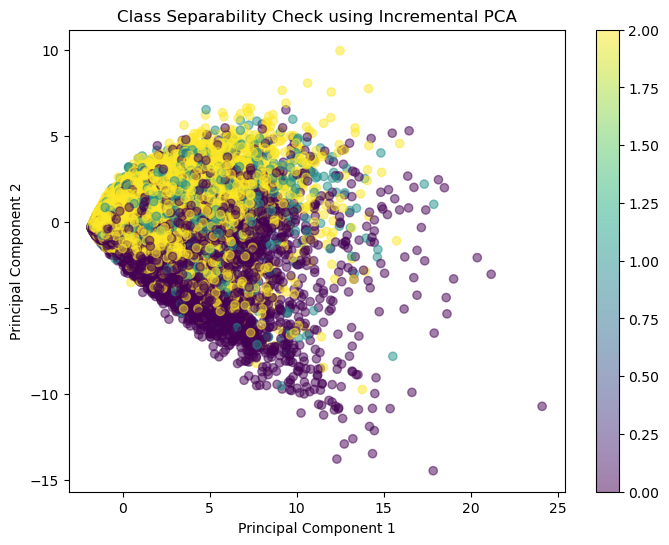

In [102]:

y_train_numeric = pd.to_numeric(y_train, errors='coerce')  


color_map = {1: 2, 0: 1, -1: 0} 
y_train_mapped = y_train_numeric.map(color_map)


print("Mapped unique values after conversion:", y_train_mapped.unique())


if y_train_mapped.isnull().any():
    print("Warning: There are NaN values in y_train_mapped.")


plt.figure(figsize=(8, 6))
plt.scatter(x_train_pca[:, 0], x_train_pca[:, 1], c=y_train_mapped, cmap='viridis', alpha=0.5)
plt.colorbar()
plt.title('Class Separability Check using Incremental PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


# Numerical Features
1. Cool
2. useful

# Run below cell after vectorization for adding above mentioned features

In [115]:

from scipy.sparse import hstack


x_train_combined = hstack([
    x_train_count_unigram,
    sampled_reviews.loc[x_train.index, ['useful', 'cool']].values
])

x_test_combined = hstack([
    x_test_count_unigram,
    sampled_reviews.loc[x_test.index, ['useful', 'cool']].values
])


In [121]:
print(x_train_combined.shape)
print(x_test_combined.shape)

(559222, 5002)
(139806, 5002)



# 1.Before Splitting data

 1. Data loading and initial exploration
 2. Sampled 3% of data 
 3. Data cleaning (handling of negations, stop words, stemming, contractions)

  

# 2.Train and Test Split

# 3.Vectorization 
Did
1. Unigram count vectorization
2. please apply different vectorization techniques according to your tasks and assignment.


# 3.Class Separability 
1. For Unigram count vectorizer, class seperability is not that good.


# 4.Numerical Features Added

1. cool
2. useful


# 5.Feature Set with Best Separability

Need to do unigram + bigram 



# 6. SVM Model with 40k records built
1. The model performs very well on class 1 across both train and test sets, showing high precision and recall.
2. Class 0 has significantly lower performance, especially in the test set, with low recall (only 8% correct predictions) and low F1 score, indicating that the model struggles to correctly identify this class.
3. Class -1 has good performance overall, but recall drops in the test set compared to the training set, indicating some overfitting for this class.
The overall accuracy is good (94% on training and 83% on testing), but there is a noticeable drop in test accuracy, which suggests the model may be slightly overfitting.
Improving the performance for class 0 might require further tuning and adjusting class weights.